In [1]:
import pandas as pd
import pandas as pd
import numpy as np
import folium
import json
import requests
import os
from shapely.geometry import Point, Polygon
from sklearn.cluster import KMeans
import seaborn as sn
import matplotlib.pyplot as plt

# Part 1a -preparing geospatial data
## In this part, I prepared all geospatial data and values necessary for further analysis:
* geojson files
* districts polygons
* centers of districts to be used in Foursquare request
* districts radiuses to be used in Foursquare request

In [2]:
# geojson files exported from .shp with QGIS (EPSG:4326 WGS 84)
warsaw_geofile = 'geodata/Warsaw_districts/warsaw_districts.geojson'

In [3]:
# loading warsaw geojson using json package
with open(warsaw_geofile) as w:
    warsaw_geojson = json.load(w)

In [4]:
# extracting districts names from geojson
warsaw_districts_names = []
for x in warsaw_geojson['features']:
    warsaw_districts_names.append(x['properties']['nazwa_dzie'])

In [5]:
# creating map with Folium to verify if geospatial data are correct
warsaw_coordinates = [52.2297700, 21.0117800]
warsaw_map = folium.Map(location=warsaw_coordinates, zoom_start=11)
folium.GeoJson(
    warsaw_geojson,
    name='geojson'
).add_to(warsaw_map)
warsaw_map

In [6]:
# finding districts centers
def get_district_centers(city_geojson):
    district_centers = {}
    for district in city_geojson['features']:
        district_geometry = pd.DataFrame(
            district['geometry']['coordinates'][0][0],
            columns=['longitude', 'latitude']
        )
        district_center = [[district_geometry['latitude'].mean(), district_geometry['longitude'].mean()]]
        district_centers[district['properties']['nazwa_dzie']]=district_center
    
    district_centers = pd.DataFrame.from_dict(district_centers,
                                              orient='index',
                                              columns=['District_center'])
    
    return district_centers

In [7]:
warsaw_district_centers = get_district_centers(warsaw_geojson)

In [8]:
warsaw_district_centers.head()

,District_center
Żoliborz,"[52.2688536216614, 20.985135391429377]"
Praga-Południe,"[52.235168690871, 21.071138918572952]"
Mokotów,"[52.18866196405862, 21.052814696946914]"
Wola,"[52.22969762335711, 20.94634273758449]"
Wilanów,"[52.15030830502675, 21.091139416474352]"


In [9]:
for center in warsaw_district_centers.index:
    folium.Marker(warsaw_district_centers.loc[center, 'District_center']).add_to(warsaw_map)
warsaw_map

In [10]:
# function which return dictionary with pairs: district name - polygon object
def create_districts_polygons(geojson):
    polygons = {}
    for district in geojson['features']:
        polygons[district['properties']['nazwa_dzie']]=district['geometry']['coordinates'][0][0]
    return polygons

In [11]:
warsaw_districts_polygons = create_districts_polygons(warsaw_geojson)

In [12]:
# calculating maximum distance from district center to polygon vertex
def calculate_radius(district_name):
    center_coords = warsaw_district_centers.loc[district_name, 'District_center']
    center_point = Point(center_coords[1], center_coords[0])
    
    polygon_points = []
    for point_coords in warsaw_districts_polygons [district_name]:
        polygon_point = Point(point_coords[0], point_coords[1])
        polygon_points.append(polygon_point)
    
    distances = []
    for point in polygon_points:
        distance_to_center = center_point.distance(point)
        distances.append(distance_to_center)
        
    max_distance = max(distances)
    # factor is necessary to convert geometrical distance to meteres -value valid for cities in Poland
    factor = 0.6157*111.3*1000
    max_distance_meters = int(max_distance*factor)
    
    return max_distance_meters

In [13]:
warsaw_districts_radiuses = {}
for district in warsaw_district_centers.index:
    warsaw_districts_radiuses[district] = calculate_radius(district)

In [14]:
warsaw_districts_radiuses

{'Żoliborz': 2735,
 'Praga-Południe': 4228,
 'Mokotów': 4866,
 'Wola': 3791,
 'Wilanów': 5010,
 'Wesoła': 3668,
 'Wawer': 7006,
 'Włochy': 4599,
 'Ursynów': 4896,
 'Śródmieście': 4339,
 'Praga-Północ': 3133,
 'Ursus': 2402,
 'Targówek': 3617,
 'Rembertów': 3461,
 'Ochota': 2640,
 'Bielany': 4385,
 'Białołęka': 7513,
 'Bemowo': 3478}

# Part 2a - using Foursquare api and response analysis.
## In this part, I create Foursquare request. Responses are then cleaned and filtered, to keep data necessary for futher analysis only.

In [15]:
# setting constants for Foursquare api
CLIENT_ID = os.environ.get('FOURSQUAREID')
CLIENT_SECRET = os.environ.get('FOURSQUARESECRET')
VERSION = '20200605'
LIMIT = 100
OFFSET=LIMIT

In [16]:
def get_venues(district_center, radius):
    RADIUS = radius
    lat, lng = district_center
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            RADIUS, 
            LIMIT)
    result = requests.get(url).json()
    
    venues = result['response']['groups'][0]['items']
    
    total_results = result['response']['totalResults']
    print('\tTotal results: ', total_results, '\n')
    
    #checking if there is more results -if true, next request with offset is send
    requests_to_perform = total_results//100
    
    for _ in range(requests_to_perform):
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&offset={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            RADIUS, 
            LIMIT,
            OFFSET
        )
        result = requests.get(url).json()
        venues.extend(result['response']['groups'][0]['items'])
        
    return venues

In [18]:
# collecting venues in warsaw
warsaw_districts_venues_foursquare = {}
for district in warsaw_district_centers.index:
    print(district)
    warsaw_districts_venues_foursquare[district] = get_venues(
        warsaw_district_centers.loc[district, 'District_center'],
        warsaw_districts_radiuses[district])

Żoliborz
	Total results:  155 

Praga-Południe
	Total results:  237 

Mokotów
	Total results:  235 

Wola
	Total results:  223 

Wilanów
	Total results:  151 

Wesoła
	Total results:  19 

Wawer
	Total results:  95 

Włochy
	Total results:  225 

Ursynów
	Total results:  140 

Śródmieście
	Total results:  235 

Praga-Północ
	Total results:  161 

Ursus
	Total results:  45 

Targówek
	Total results:  146 

Rembertów
	Total results:  38 

Ochota
	Total results:  163 

Bielany
	Total results:  95 

Białołęka
	Total results:  122 

Bemowo
	Total results:  61 



In [19]:
# function which extract data necessary for futher analysis from Foursquare response
def extract_data(district,district_venues_foursquare):
    district_venues=[]
    for item in district_venues_foursquare:
        x={}
        x['District']=district
        x['Name']=item['venue']['name']
        x['Category']=item['venue']['categories'][0]['name']
        x['Lat'] = item['venue']['location']['lat']
        x['Lon'] = item['venue']['location']['lng']
        x['VenueId'] = item['venue']['id']
        district_venues.append(x)
    district_df = pd.DataFrame(district_venues)
    return district_df

In [20]:
def get_districts_venues(city_districts_venues):
    all_city_venues= pd.DataFrame()
    for district in city_districts_venues.keys():
        district_df = extract_data(district, city_districts_venues[district])
        district_df['District'] = district
        all_city_venues = all_city_venues.append(district_df, ignore_index=True)
    return all_city_venues

In [21]:
warsaw_districts_venues = get_districts_venues(warsaw_districts_venues_foursquare)

In [22]:
warsaw_districts_venues.head()

,District,Name,Category,Lat,Lon,VenueId
0,Żoliborz,Galeria Wypieków,Bakery,52.268523,20.986111,55508b67498e2dcf9038f190
1,Żoliborz,Park Żeromskiego,Park,52.268377,20.988747,4baf7aa5f964a52031033ce3
2,Żoliborz,Plac Wilsona,Plaza,52.268914,20.985587,4bb771276edc76b0a92e321c
3,Żoliborz,Prochownia Żoliborz,Café,52.268676,20.989228,50b68fd0e4b0132956a40f65
4,Żoliborz,Kino Wisła,Indie Movie Theater,52.269609,20.986743,4c14d3afa9c220a11e18589d


In [23]:
def pin_venues(venues_df,city_map):
    for i in venues_df.index:
        folium.Marker([venues_df.loc[i,'Lat'], venues_df.loc[i,'Lon']]).add_to(city_map)

In [24]:
# function which check out if given coordinates are inside given polygon
def check_if_inside_district(venue_coords, district_shape):
    p = Point(venue_coords)
    poly = Polygon(district_shape)
    return p.within(poly)

In [25]:
# verification if venue is inside district
for i in warsaw_districts_venues.index:
    warsaw_districts_venues.loc[i, 'Inside'] = check_if_inside_district(
                                        [warsaw_districts_venues.loc[i,'Lon'], warsaw_districts_venues.loc[i,'Lat']],
                                        warsaw_districts_polygons[warsaw_districts_venues.loc[i,'District']])

In [26]:
# filtering venues which are inside district
warsaw_districts_venues = warsaw_districts_venues.loc[warsaw_districts_venues['Inside']==True]

In [27]:
warsaw_districts_venues.head()

,District,Name,Category,Lat,Lon,VenueId,Inside
0,Żoliborz,Galeria Wypieków,Bakery,52.268523,20.986111,55508b67498e2dcf9038f190,True
1,Żoliborz,Park Żeromskiego,Park,52.268377,20.988747,4baf7aa5f964a52031033ce3,True
2,Żoliborz,Plac Wilsona,Plaza,52.268914,20.985587,4bb771276edc76b0a92e321c,True
3,Żoliborz,Prochownia Żoliborz,Café,52.268676,20.989228,50b68fd0e4b0132956a40f65,True
4,Żoliborz,Kino Wisła,Indie Movie Theater,52.269609,20.986743,4c14d3afa9c220a11e18589d,True


In [28]:
warsaw_top5 = warsaw_districts_venues.groupby('Category').count().sort_values(by='VenueId', ascending=False).head()

In [29]:
warsaw_top5

,District,Name,Lat,Lon,VenueId,Inside
Category,,,,,,
Café,70,70,70,70,70,70
Park,56,56,56,56,56,56
Coffee Shop,43,43,43,43,43,43
Italian Restaurant,42,42,42,42,42,42
Supermarket,35,35,35,35,35,35


# Part 1 -b -same as part 1, but for Krakow

In [30]:
cracow_geofile = 'geodata/Cracow_districts/cracow_districts.geojson'

In [31]:
with open(cracow_geofile) as c:
    cracow_geojson = json.load(c)

In [32]:
cracow_districts_names = []
for x in cracow_geojson['features']:
    cracow_districts_names.append(x['properties']['nazwa'])

In [33]:
cracow_coordinates = [50.06143, 19.93658]
cracow_map = folium.Map(location=cracow_coordinates, zoom_start=11)

folium.GeoJson(
    cracow_geojson,
    name='geojson'
).add_to(cracow_map)
cracow_map

In [34]:
def get_cracow_centers(city_geojson):
    district_centers = {}
    for district in city_geojson['features']:
        district_geometry = pd.DataFrame(
            district['geometry']['coordinates'][0][0],
            columns=['longitude', 'latitude']
        )
        district_center = [[district_geometry['latitude'].mean(), district_geometry['longitude'].mean()]]
        district_centers[district['properties']['nazwa']]=district_center
    
    district_centers = pd.DataFrame.from_dict(district_centers,
                                              orient='index',
                                              columns=['District_center'])
    
    return district_centers

In [35]:
cracow_districts_centers = get_cracow_centers(cracow_geojson)

In [36]:
def create_cracow_polygons(geojson):
    polygons = {}
    for district in geojson['features']:
        polygons[district['properties']['nazwa']]=district['geometry']['coordinates'][0][0]
    return polygons

In [37]:
cracow_districts_polygons = create_cracow_polygons(cracow_geojson)

In [38]:
def calculate_cracow_radius(district_name):
    center_coords = cracow_districts_centers.loc[district_name, 'District_center']
    center_point = Point(center_coords[1], center_coords[0])
    
    polygon_points = []
    for point_coords in cracow_districts_polygons [district_name]:
        polygon_point = Point(point_coords[0], point_coords[1])
        polygon_points.append(polygon_point)
    
    distances = []
    for point in polygon_points:
        distance_to_center = center_point.distance(point)
        distances.append(distance_to_center)
        
    max_distance = max(distances)
    factor = 0.6157*111.3*1000
    max_distance_meters = int(max_distance*factor)
    
    return max_distance_meters

In [39]:
cracow_districts_radiuses = {}
for district in cracow_districts_centers.index:
    cracow_districts_radiuses[district] = calculate_cracow_radius(district)

# Part 2b -same as part 2, but for Krakow.

In [40]:
cracow_districts_venues_foursquare = {}
for district in cracow_districts_centers.index:
    print(district)
    cracow_districts_venues_foursquare[district] = get_venues(
        cracow_districts_centers.loc[district, 'District_center'],
        cracow_districts_radiuses[district])

Stare Miasto
	Total results:  227 

Grzegórzki
	Total results:  165 

Prądnik Czerwony
	Total results:  58 

Prądnik Biały
	Total results:  120 

Krowodrza
	Total results:  210 

Bronowice
	Total results:  89 

Zwierzyniec
	Total results:  130 

Dębniki
	Total results:  52 

Łagiewniki-Borek Fałęcki
	Total results:  43 

Swoszowice
	Total results:  52 

Podgórze Duchackie
	Total results:  53 

Bieżanów-Prokocim
	Total results:  32 

Podgórze
	Total results:  220 

Czyżyny
	Total results:  77 

Mistrzejowice
	Total results:  22 

Bieńczyce
	Total results:  42 

Wzgórza Krzesławickie
	Total results:  17 

Nowa Huta
	Total results:  32 



In [41]:
cracow_districts_venues = get_districts_venues(cracow_districts_venues_foursquare)

In [42]:
for i in cracow_districts_venues.index:
    cracow_districts_venues.loc[i, 'Inside'] = check_if_inside_district(
                                        [cracow_districts_venues.iloc[i]['Lon'], cracow_districts_venues.loc[i]['Lat']],
                                        cracow_districts_polygons[cracow_districts_venues.iloc[i]['District']])

In [43]:
cracow_districts_venues = cracow_districts_venues.loc[cracow_districts_venues['Inside']==True]
cracow_top5 = cracow_districts_venues.groupby('Category').count().sort_values(by='VenueId', ascending=False).head()

In [44]:
cracow_top5

,District,Name,Lat,Lon,VenueId,Inside
Category,,,,,,
Hotel,47,47,47,47,47,47
Supermarket,35,35,35,35,35,35
Café,29,29,29,29,29,29
Polish Restaurant,26,26,26,26,26,26
Italian Restaurant,24,24,24,24,24,24


In [45]:
for i in cracow_districts_venues.index:    
    folium.Marker([cracow_districts_venues.loc[i,'Lat'], cracow_districts_venues.loc[i,'Lon']]).add_to(cracow_map)

# Part 3 -creating choroplets maps.
## In this part, I concatenated two cities data, and prepared data for creating choroplets maps.

In [46]:
top_categories = warsaw_top5.add(cracow_top5, fill_value=0)

In [47]:
top_5_categories = top_categories.head().index
top_5_categories

Index(['Café', 'Coffee Shop', 'Hotel', 'Italian Restaurant', 'Park'], dtype='object', name='Category')

In [48]:
# area of districts in km2
warsaw_districts_area = {'Mokotów':35.42, 'Praga-Południe':22.38, 'Ursynów':43.79, 'Wola':19.26, 'Bielany':32.34,
                            'Targówek':24.22, 'Bemowo':24.95, 'Śródmieście':15.57, 'Białołęka':73.04, 'Ochota':9.72,
                            'Wawer':79.70, 'Praga-Północ':11.42, 'Ursus':9.36, 'Żoliborz':8.47, 'Włochy':28.63,
                            'Wilanów':36.73, 'Wesoła':22.94, 'Rembertów':19.30}

In [49]:
warsaw_districts_venues_top5 = warsaw_districts_venues[warsaw_districts_venues.Category.isin(top_5_categories)]
warsaw_top5 = warsaw_districts_venues_top5.groupby(['District', 'Category']).count()

In [50]:
warsaw_top5 = warsaw_districts_venues_top5.groupby(['District', 'Category']).count()

In [51]:
warsaw_top5.head()

Name  Lat  Lon  VenueId  Inside
District  Category                                           
Bemowo    Café                   3    3    3        3       3
          Coffee Shop            2    2    2        2       2
          Italian Restaurant     3    3    3        3       3
          Park                   3    3    3        3       3
Białołęka Café                   1    1    1        1       1

In [52]:
# calculating category denisty: number of venues of given type in ditrict / distric area
warsaw_categories_density={}
for District, Category in warsaw_top5.index:
    warsaw_categories_density[(Category, District)]=warsaw_top5.loc[District, Category].VenueId/warsaw_districts_area[District]

In [53]:
warsaw_categories_density = pd.DataFrame(warsaw_categories_density, index=[1]).T
warsaw_categories_density.reset_index(inplace=True)
warsaw_categories_density.columns=['Category', 'District', 'Category_density']

In [54]:
warsaw_categories_density.head(10)

,Category,District,Category_density
0,Café,Bemowo,0.120240
1,Coffee Shop,Bemowo,0.080160
2,Italian Restaurant,Bemowo,0.120240
3,Park,Bemowo,0.120240
4,Café,Białołęka,0.013691
5,Coffee Shop,Białołęka,0.013691
6,Hotel,Białołęka,0.027382
7,Italian Restaurant,Białołęka,0.013691
8,Park,Białołęka,0.013691
9,Café,Bielany,0.123686


In [55]:
top_5_categories

Index(['Café', 'Coffee Shop', 'Hotel', 'Italian Restaurant', 'Park'], dtype='object', name='Category')

In [56]:
cracow_districts_area = {'Stare Miasto': 5.56, 'Grzegórzki': 5.84, 'Prądnik Czerwony': 6.43, 'Prądnik Biały': 23.41,
                        'Krowodrza': 5.61, 'Bronowice': 13.54, 'Zwierzyniec': 28.73, 'Dębniki': 46.18,
                        'Łagiewniki-Borek Fałęcki':54.15, 'Swoszowice': 25.6, 'Podgórze Duchackie': 95.40,
                        'Bieżanów-Prokocim': 18.47, 'Podgórze': 25.66, 'Czyżyny': 12.25, 'Mistrzejowice': 55.90,
                        'Bieńczyce': 36.99, 'Wzgórze Krzesławickie': 23.81, 'Nowa Huta': 65.40}

In [57]:
cracow_districts_venues_top5 = cracow_districts_venues[cracow_districts_venues.Category.isin(top_5_categories)]
cracow_top5 = cracow_districts_venues_top5.groupby(['District', 'Category']).count()

In [58]:
cracow_categories_density={}
for District, Category in cracow_top5.index:
    cracow_categories_density[(Category, District)]=cracow_top5.loc[District, Category].VenueId/cracow_districts_area[District]

In [59]:
cracow_categories_density = pd.DataFrame(cracow_categories_density, index=[1]).T
cracow_categories_density.reset_index(inplace=True)
cracow_categories_density.columns=['Category', 'District', 'Category_density']

In [60]:
cracow_warsaw_categories_density = pd.concat([warsaw_categories_density, cracow_categories_density])

In [61]:
# calculating scales to be used with choroplets maps -the same for Warsaw and Krakow
scale_limits = {}
for category in cracow_warsaw_categories_density.Category.unique():
    intervals = pd.cut(
        cracow_warsaw_categories_density.loc[cracow_warsaw_categories_density.Category==category].Category_density,
        5,
        retbins=True)[1]
    scale_limits[category]=list(intervals)
    scale_limits[category][0]=0
    scale_limits[category][-1] = scale_limits[category][-1]+0.44

In [62]:
pd.cut(cracow_warsaw_categories_density.loc[cracow_warsaw_categories_density.Category=='Café'].Category_density, 5)

0     (0.0069, 0.728]
4     (0.0069, 0.728]
9     (0.0069, 0.728]
12    (0.0069, 0.728]
16    (0.0069, 0.728]
21    (0.0069, 0.728]
25    (0.0069, 0.728]
28    (0.0069, 0.728]
30    (0.0069, 0.728]
37    (0.0069, 0.728]
42    (0.0069, 0.728]
47    (0.0069, 0.728]
50    (0.0069, 0.728]
55    (0.0069, 0.728]
60     (0.728, 1.445]
65    (0.0069, 0.728]
5     (0.0069, 0.728]
7     (0.0069, 0.728]
12    (0.0069, 0.728]
17    (0.0069, 0.728]
24    (0.0069, 0.728]
27    (0.0069, 0.728]
29    (0.0069, 0.728]
32    (0.0069, 0.728]
39      (2.88, 3.597]
Name: Category_density, dtype: category
Categories (5, interval[float64]): [(0.0069, 0.728] < (0.728, 1.445] < (1.445, 2.162] < (2.162, 2.88] < (2.88, 3.597]]

In [63]:
scale_limits['Café']

[0,
 0.7278102046664555,
 1.4451382290394101,
 2.1624662534123646,
 2.879794277785319,
 4.037122302158274]

In [64]:
scale_limits['Coffee Shop']

[0,
 0.4776635404349043,
 0.9427800294268976,
 1.407896518418891,
 1.8730130074108844,
 2.7781294964028778]

In [65]:
cracow_maps = {}
for category in cracow_categories_density.Category.unique():
    category_density = cracow_categories_density.loc[cracow_categories_density.Category==category]
    cracow_category_map = folium.Map(location=cracow_coordinates, zoom_start=11)
    cracow_category_map.choropleth(
    geo_data=cracow_geojson,
    name='choropleth',
    data=category_density,
    columns=['District', 'Category_density'],
    key_on='feature.properties.nazwa',
    fill_color='YlGn',
    threshold_scale=scale_limits[category],
    fill_opacity=0.9,
    line_opacity=0.9,
    legend_name='Density [no./km2]'
)
    cracow_maps[category]=cracow_category_map

In [66]:
warsaw_maps = {}
for category in warsaw_categories_density.Category.unique():
    category_density = warsaw_categories_density.loc[warsaw_categories_density.Category==category]
    warsaw_category_map = folium.Map(location=warsaw_coordinates, zoom_start=11)
    warsaw_category_map.choropleth(
    geo_data=warsaw_geojson,
    name='choropleth',
    data=category_density,
    columns=['District', 'Category_density'],
    key_on='feature.properties.nazwa_dzie',
    fill_color='YlGn',
    threshold_scale=scale_limits[category],
    fill_opacity=0.9,
    line_opacity=0.9,
    legend_name='Density[no./km2]'
)
    warsaw_maps[category]=warsaw_category_map

In [67]:
cracow_maps['Café']

In [68]:
warsaw_maps['Café']

In [69]:
cracow_maps['Coffee Shop']

In [70]:
warsaw_maps['Coffee Shop']

In [71]:
cracow_maps['Hotel']

In [72]:
warsaw_maps['Hotel']

In [73]:
cracow_maps['Italian Restaurant']

In [74]:
warsaw_maps['Italian Restaurant']

In [75]:
cracow_maps['Park']

In [76]:
warsaw_maps['Park']

# Part 4 -districts clustering.
## In this part, I performed two cities districts clustering, using k-mean algorithm.

In [77]:
both_cities_venues = pd.concat([warsaw_districts_venues, cracow_districts_venues], axis=0)

In [78]:
both_cities_venues

,District,Name,Category,Lat,Lon,VenueId,Inside
0,Żoliborz,Galeria Wypieków,Bakery,52.268523,20.986111,55508b67498e2dcf9038f190,True
1,Żoliborz,Park Żeromskiego,Park,52.268377,20.988747,4baf7aa5f964a52031033ce3,True
2,Żoliborz,Plac Wilsona,Plaza,52.268914,20.985587,4bb771276edc76b0a92e321c,True
3,Żoliborz,Prochownia Żoliborz,Café,52.268676,20.989228,50b68fd0e4b0132956a40f65,True
4,Żoliborz,Kino Wisła,Indie Movie Theater,52.269609,20.986743,4c14d3afa9c220a11e18589d,True
...,...,...,...,...,...,...,...
1876,Nowa Huta,Tesco,Supermarket,50.078091,20.030155,51afa9ad498e263119497ccb,True
1877,Nowa Huta,Hala Widowiskowo Sportowa Wanda Krakow,Stadium,50.067503,20.059290,4f087e2ee4b0540ca2254cbb,True
1878,Nowa Huta,Stadion Suche Stawy,Soccer Stadium,50.064562,20.056925,4f84470fe4b03e850bbe4a67,True
1881,Nowa Huta,Yacht Klub Polski - Kraków,Harbor / Marina,50.051407,20.058249,58df7f80e309e10268f601d6,True


In [79]:
# one hot encoding
both_cities_onehot = pd.get_dummies(both_cities_venues[['Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
both_cities_onehot['District'] = both_cities_venues['District'] 

# move neighborhood column to the first column
fixed_columns = [both_cities_onehot.columns[-1]] + list(both_cities_onehot.columns[:-1])
both_cities_onehot = both_cities_onehot[fixed_columns]

both_cities_onehot.head()

,District,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Waterfront,Wine Bar,Wine Shop,Yoga Studio,Zoo
0,Żoliborz,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Żoliborz,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Żoliborz,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Żoliborz,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Żoliborz,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [80]:
both_cities_onehot.shape

(1833, 227)

In [81]:
both_cities_grouped = both_cities_onehot.groupby('District').mean().reset_index()
both_cities_grouped.head()

,District,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Waterfront,Wine Bar,Wine Shop,Yoga Studio,Zoo
0,Bemowo,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.025000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,Białołęka,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.038462,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,Bielany,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.022727,...,0.0,0.0,0.000000,0.022727,0.0,0.0,0.0,0.0,0.0,0.0
3,Bieńczyce,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,Bieżanów-Prokocim,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [82]:
both_cities_grouped.shape

(36, 227)

In [83]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [84]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['District']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
districts_venues_sorted = pd.DataFrame(columns=columns)
districts_venues_sorted['District'] = both_cities_grouped['District']

for ind in np.arange(both_cities_grouped.shape[0]):
    districts_venues_sorted.iloc[ind, 1:] = return_most_common_venues(both_cities_grouped.iloc[ind, :], num_top_venues)

districts_venues_sorted.head()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bemowo,Supermarket,Park,Café,Italian Restaurant,Shopping Mall,Playground,Coffee Shop,Bowling Alley,Martial Arts School,Mexican Restaurant
1,Białołęka,Supermarket,Shopping Mall,Hotel,Grocery Store,Café,Fast Food Restaurant,Pizza Place,Multiplex,Sporting Goods Shop,Farmers Market
2,Bielany,Park,Café,Grocery Store,Gym / Fitness Center,Coffee Shop,Indian Restaurant,Supermarket,Gym,Pizza Place,Department Store
3,Bieńczyce,Burger Joint,Park,Market,Gym,Lake,Farmers Market,Fast Food Restaurant,Athletics & Sports,Supermarket,Food & Drink Shop
4,Bieżanów-Prokocim,Tram Station,Pizza Place,Hotel,Field,Supermarket,Go Kart Track,Bus Station,Gym Pool,Bar,Bakery


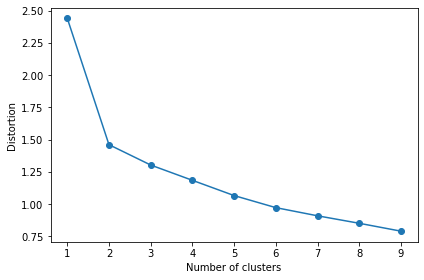

In [85]:
# calculation of optimal value of clusters -so called "Elbow method"
distortions = []
both_cities_grouped_clustering = both_cities_grouped.drop('District', 1)

for i in range(1,10):
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(both_cities_grouped_clustering)
    distortions.append(km.inertia_)

plt.plot(range(1,10), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.tight_layout()
plt.show()

In [86]:
# set number of clusters
kclusters = 3

#both_cities_grouped_clustering = both_cities_grouped.drop('District', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(both_cities_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 2, 1, 2, 2, 1, 2, 2, 2], dtype=int32)

In [87]:
# add clustering labels
#districts_venues_sorted.drop('Cluster Labels', axis=1, inplace=True)
districts_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [88]:
districts_venues_sorted.groupby('Cluster Labels').count()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,
0,1,1,1,1,1,1,1,1,1,1,1
1,13,13,13,13,13,13,13,13,13,13,13
2,22,22,22,22,22,22,22,22,22,22,22


In [89]:
districts_venues_sorted.sort_values(by='Cluster Labels')

,Cluster Labels,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
30,0,Wzgórza Krzesławickie,Go Kart Track,Zoo,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop,Flea Market,Field
0,1,Bemowo,Supermarket,Park,Café,Italian Restaurant,Shopping Mall,Playground,Coffee Shop,Bowling Alley,Martial Arts School,Mexican Restaurant
19,1,Prądnik Czerwony,Diner,Park,Fast Food Restaurant,Food & Drink Shop,Bus Station,Supermarket,IT Services,Market,Pizza Place,Convenience Store
18,1,Prądnik Biały,Supermarket,Hotel,Coffee Shop,Fast Food Restaurant,Sandwich Place,Grocery Store,Park,Big Box Store,Ice Cream Shop,Food & Drink Shop
23,1,Targówek,Supermarket,Gym,Furniture / Home Store,Pizza Place,Park,Plaza,Bookstore,Market,Sporting Goods Shop,Bus Station
24,1,Ursus,Park,Supermarket,Italian Restaurant,Gym Pool,Gym / Fitness Center,Fast Food Restaurant,Hotel,Bus Station,Clothing Store,Sporting Goods Shop
15,1,Podgórze Duchackie,Supermarket,Fast Food Restaurant,Clothing Store,Ice Cream Shop,Shopping Mall,Gas Station,Coffee Shop,Grocery Store,Electronics Store,Food Court
14,1,Podgórze,Supermarket,Buffet,Park,Food & Drink Shop,Gas Station,Go Kart Track,Gym,Beer Bar,Plaza,Restaurant
20,1,Rembertów,Bus Station,Park,Supermarket,Café,Train Station,Discount Store,Gym Pool,Farmers Market,Fast Food Restaurant,Field
10,1,Mistrzejowice,Coffee Shop,Gym,Grocery Store,Clothing Store,Ice Cream Shop,Water Park,Shopping Mall,Italian Restaurant,Park,Supermarket


In [90]:
cracow_clusters_labels = districts_venues_sorted[districts_venues_sorted.District.isin(cracow_districts_names)]

In [91]:
cracow_clusters_labels.groupby('Cluster Labels').count()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,
0,1,1,1,1,1,1,1,1,1,1,1
1,8,8,8,8,8,8,8,8,8,8,8
2,9,9,9,9,9,9,9,9,9,9,9


In [92]:
clusters_scale = [0.1,1.01,2.01]
cracow_clusters_map = folium.Map(location=cracow_coordinates, zoom_start=11)
cracow_clusters_map.choropleth(
geo_data=cracow_geojson,
name='choropleth',
data=cracow_clusters_labels,
columns=['District', 'Cluster Labels'],
key_on='feature.properties.nazwa',
fill_color='BuPu',
fill_opacity=0.9,
line_opacity=0.9,
threshold_scale = clusters_scale,
legend_name='Cluster_label'
)

In [93]:
cracow_clusters_map

In [94]:
warsaw_clusters_labels = districts_venues_sorted[districts_venues_sorted.District.isin(warsaw_districts_names)]

In [95]:
warsaw_clusters_labels.groupby('Cluster Labels').count()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,
1,5,5,5,5,5,5,5,5,5,5,5
2,13,13,13,13,13,13,13,13,13,13,13


In [96]:
warsaw_clusters_map = folium.Map(location=warsaw_coordinates, zoom_start=11)
warsaw_clusters_map.choropleth(
geo_data=warsaw_geojson,
name='choropleth',
data=warsaw_clusters_labels,
columns=['District', 'Cluster Labels'],
key_on='feature.properties.nazwa_dzie',
fill_color='BuPu',
fill_opacity=0.9,
line_opacity=0.9,
threshold_scale = clusters_scale,
legend_name='Density'
)

In [97]:
warsaw_clusters_map

In [98]:
# types of venues most popular in cluster 1
districts_venues_sorted.loc[districts_venues_sorted['Cluster Labels']==1].iloc[:,2:].stack().value_counts().head()

Supermarket             13
Park                     9
Fast Food Restaurant     8
Gym                      5
Pizza Place              5
dtype: int64

In [99]:
# types of venues most popular in cluster 2
districts_venues_sorted.loc[districts_venues_sorted['Cluster Labels']==2].iloc[:,2:].stack().value_counts().head()

Café                  15
Park                  12
Italian Restaurant    11
Coffee Shop           11
Pizza Place           10
dtype: int64

In [100]:
both_cities_grouped.head()

,District,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Waterfront,Wine Bar,Wine Shop,Yoga Studio,Zoo
0,Bemowo,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.025000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,Białołęka,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.038462,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,Bielany,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.022727,...,0.0,0.0,0.000000,0.022727,0.0,0.0,0.0,0.0,0.0,0.0
3,Bieńczyce,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,Bieżanów-Prokocim,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


# Part 5 -correlations.
## In this part, I preapared correlation matrix and examined some of correlations.

In [101]:
# creating correlation matrix
corr_matrix = both_cities_grouped.set_index('District').corr()

In [102]:
corr_matrix.shape

(226, 226)

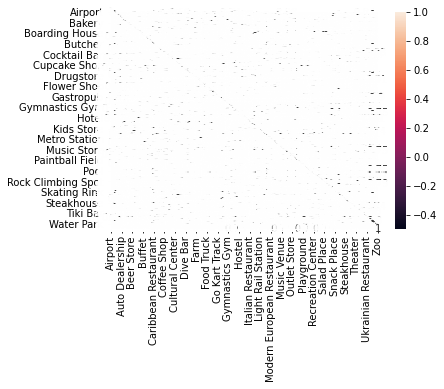

In [103]:
#creating heatmap of correlations
sn.heatmap(corr_matrix, annot=True)

In [104]:
correlation_abs = corr_matrix.abs()

In [105]:
correlation_pairs=correlation_abs.unstack()

In [106]:
correlation_abs

,Airport,Airport Lounge,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,...,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Waterfront,Wine Bar,Wine Shop,Yoga Studio,Zoo
Airport,1.000000,0.479543,0.114151,0.050556,0.091548,0.099952,0.062138,0.125421,0.010989,0.050556,...,0.050556,0.115933,0.097393,0.501587,0.061724,0.050556,0.115231,0.101999,0.067421,0.071849
Airport Lounge,0.479543,1.000000,0.064512,0.028571,0.051738,0.056488,0.035117,0.070882,0.075737,0.028571,...,0.028571,0.065519,0.055041,0.040560,0.034883,0.028571,0.065123,0.057645,0.038103,0.040605
American Restaurant,0.114151,0.064512,1.000000,0.064512,0.116821,0.127545,0.307171,0.364315,0.139165,0.064512,...,0.064512,0.059627,0.028008,0.091582,0.078764,0.064512,0.182619,0.055579,0.029338,0.091684
Arcade,0.050556,0.028571,0.064512,1.000000,0.301151,0.134728,0.226949,0.070882,0.075737,0.028571,...,0.028571,0.482733,0.055041,0.040560,0.034883,1.000000,0.624250,0.057645,0.038103,0.040605
Art Gallery,0.091548,0.051738,0.116821,0.301151,1.000000,0.318191,0.026321,0.171114,0.039933,0.051738,...,0.174984,0.432089,0.099670,0.073447,0.063168,0.301151,0.263370,0.022917,0.068998,0.073529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Waterfront,0.050556,0.028571,0.064512,1.000000,0.301151,0.134728,0.226949,0.070882,0.075737,0.028571,...,0.028571,0.482733,0.055041,0.040560,0.034883,1.000000,0.624250,0.057645,0.038103,0.040605
Wine Bar,0.115231,0.065123,0.182619,0.624250,0.263370,0.038631,0.416654,0.521781,0.155063,0.065123,...,0.065123,0.802962,0.045478,0.092449,0.079509,0.624250,1.000000,0.090255,0.086848,0.092552
Wine Shop,0.101999,0.057645,0.055579,0.057645,0.022917,0.530406,0.070850,0.027932,0.085915,0.057645,...,0.328835,0.065375,0.111049,0.081832,0.070379,0.057645,0.090255,1.000000,0.034637,0.081924
Yoga Studio,0.067421,0.038103,0.029338,0.038103,0.068998,0.466086,0.046832,0.094528,0.053390,0.038103,...,0.038103,0.087377,0.390385,0.054091,0.046520,0.038103,0.086848,0.034637,1.000000,0.054151


In [107]:
correlation_pairs.loc['Café'].sort_values(ascending=False)[:10]

Café                     1.000000
Dessert Shop             0.570048
Beach                    0.482138
Sushi Restaurant         0.477535
Recreation Center        0.476165
Ramen Restaurant         0.476165
General Entertainment    0.463222
Beer Bar                 0.460657
Liquor Store             0.433627
Yoga Studio              0.433627
dtype: float64

In [108]:
correlation_pairs.loc['Beer Bar'].sort_values(ascending=False)[:10]

Beer Bar               1.000000
Hotel Bar              0.672429
Art Museum             0.639414
Wine Bar               0.574330
Waterfront             0.566096
Arcade                 0.566096
Dumpling Restaurant    0.566096
Hookah Bar             0.566096
Castle                 0.566096
Soup Place             0.566096
dtype: float64

In [109]:
correlation_pairs.loc['Airport'].sort_values(ascending=False)[:10]

Airport             1.000000
Gymnastics Gym      0.656242
Museum              0.656242
Rock Club           0.626029
Department Store    0.624213
Drugstore           0.611846
Theme Park          0.555245
Roller Rink         0.532553
Warehouse Store     0.501587
Airport Lounge      0.479543
dtype: float64